# Dog Breed Classification
This notebook builds a end-to-end multi class image classifier using TensorFlow 2.0 and TensorFlow Hub

## 1. Problem
Identification of dog breed given the image of the dog.

## 2. Data
link:

## 3. Evaluation
The evaluation is a file with prediction probabilities of each text image.

Evaluating on multi class log loss between the predicted value and observed target.

## 4. Features
* We are dealing with images (unstructured data).
* There are a total of 120 breeds of dogs.

In [ ]:
#unzip the uploaded data into Google drive.
#!unzip "drive/MyDrive/dog-vision/dog-breed-identification.zip" -d "drive/MyDrive/dog-vision/"

In [ ]:
#from google.colab import drive
#drive.mount('/content/drive')

### Get our workplace ready


In [ ]:
#Import TensorFlow into Colab
import tensorflow as tf
import tensorflow_hub as hub
print("TF version", tf.__version__)
print("TF hub version", hub.__version__)

TF version 2.17.0
TF hub version 0.16.1


In [ ]:
#checking for gpu availability
print("GPU available." if tf.config.list_physical_devices('GPU') else ("Not available"))

GPU available.


### Getting our Data ready(Turning into Tensors)

In [ ]:
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/dog-vision/labels.csv")
print(labels_csv.describe)
print(labels_csv.head())

<bound method NDFrame.describe of                                      id                     breed
0      000bec180eb18c7604dcecc8fe0dba07               boston_bull
1      001513dfcb2ffafc82cccf4d8bbaba97                     dingo
2      001cdf01b096e06d78e9e5112d419397                  pekinese
3      00214f311d5d2247d5dfe4fe24b2303d                  bluetick
4      0021f9ceb3235effd7fcde7f7538ed62          golden_retriever
...                                 ...                       ...
10217  ffd25009d635cfd16e793503ac5edef0                    borzoi
10218  ffd3f636f7f379c51ba3648a9ff8254f            dandie_dinmont
10219  ffe2ca6c940cddfee68fa3cc6c63213f                  airedale
10220  ffe5f6d8e2bff356e9482a80a6e29aac        miniature_pinscher
10221  fff43b07992508bc822f33d8ffd902ae  chesapeake_bay_retriever

[10222 rows x 2 columns]>
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97    

<Axes: xlabel='breed'>

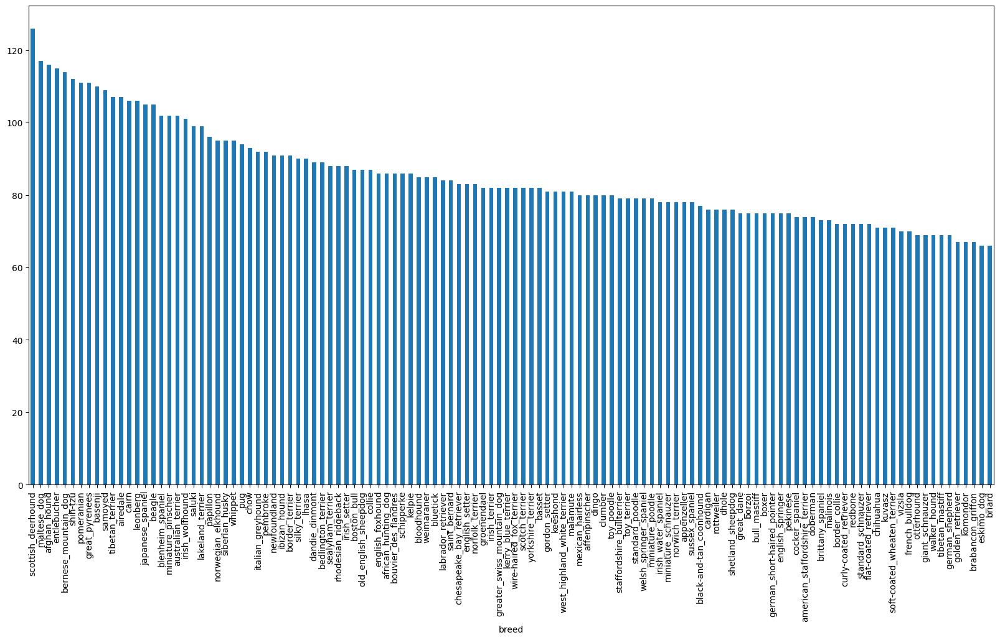

In [ ]:
#how many images are there in each class
labels_csv['breed'].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv['breed'].value_counts().median()

82.0

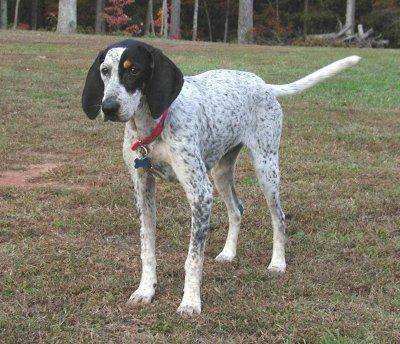

In [ ]:
#Viewing an image
from IPython.display import Image
Image("drive/MyDrive/dog-vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg")

### Getting images and their labels
Let's get a list of all of our image file pathnames.

In [ ]:
filesname = ["drive/MyDrive/dog-vision/train/"+fname+".jpg" for fname in labels_csv['id']]
filesname[:10]

['drive/MyDrive/dog-vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/dog-vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/dog-vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/dog-vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/dog-vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/dog-vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/dog-vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/dog-vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/dog-vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/dog-vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
#Check whether the size of filesname matches the size of the actual image files.
import os
if len(os.listdir("drive/MyDrive/dog-vision/train/")) == len(filesname):
  print("filesname length is same as the actual image file length")
else:
  print("filesname length is not as same as the actual image file length")


filesname length is same as the actual image file length


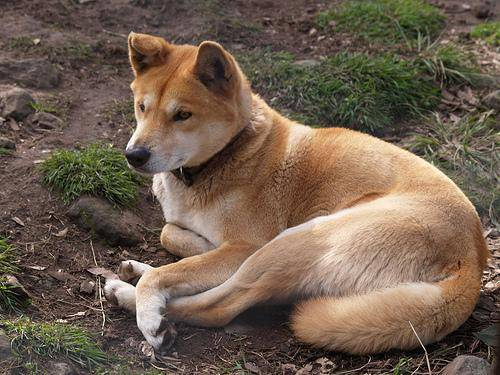

In [ ]:
Image(filesname[4000])

Since we've now got our training image filepaths in a list, lets prepare our labels.

In [ ]:
import numpy as np
labels =labels_csv['breed'].to_numpy()
#labels = np.array(labels) # does the same thing
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# Checking if the length of labels matches the filesname
if(len(filesname) == len(labels)):
  print("length of filesname matches the length of the labels")
else:
  print("The length does not matches ")


length of filesname matches the length of the labels


In [ ]:
#Finding the unique labels values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
#Turn a single label into a array of boolean
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
#Turn every label into the boolean array
boolean_label = [label == unique_breeds for label in labels]
boolean_label[:2]


[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_label)

10222

In [ ]:
#Example turning boolean arrays into integers
print(labels[0])
print(np.where(unique_breeds == labels[0])) # index where the label occurs
print(boolean_label[0].argmax()) # index where the label occurs in boolean_label
print(boolean_label[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set
Since the data set from kaggle doesn't come with validation set, therefore creating our own validation set


In [ ]:
#setup X and Y variables
X = filesname
Y = boolean_label

We are first going to work on 1000 data.

In [ ]:
#set number of images to use for experimentation
NUM_IMAGES = 1000 #@param {type:"slider", min: 1000, max: 10000, step:1000}

In [ ]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

#spliting them into train and validation size of NUM_IMAGES
X_train, X_val, Y_train, Y_val = train_test_split(X[:NUM_IMAGES], Y[:NUM_IMAGES], test_size = 0.2, random_state = 42)

len(X_train), len(Y_train), len(X_val), len(Y_val)

(800, 800, 200, 200)

### Preprocessing images(Turning images into Tensors)
To preprocess our images into tensors we're going to wrtie a fuction which does a few things:
1. Take image filepath as input.
2. Use TensorFlow to read the file and save it to a variable `image`.
3. Turn our `image` (a jpg) into Tensors.
4. Resize the `image` to be a shape  of (224, 224).
5. Return the modified `image`.

In [ ]:
#Convert images to numpy array
from matplotlib.pyplot import imread
image = imread(filesname[42])
image.shape

(257, 350, 3)

In [ ]:
image.max(), image.min()

(255, 0)

In [ ]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [ ]:
# Turn image into tensors
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [ ]:
#Define Image size
IMG_SIZE = 224

#Creating a function for preprocessing images
def process_image(image_path):
  """
  Takes an image file path and turns the image into Tensor.
  """
  #Read an image path
  image = tf.io.read_file(image_path)
  #Turns jpg image into numerical Tensor with 3 image channels (Red, Blue, Green)
  image = tf.image.decode_jpeg(image, channels=3)
  #Convert the color channels from 0-255 to 0-1
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired values (244, 244)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image


## Turning data into batches

In order to use TensorFlow effectively, we need our data in the form of Tensor tuple `(image, label)`.


In [ ]:
#Create a function to return a tuple (image, label).
def get_image_label(image_path, label):
  """
  Takes an image path and the associated label,
  processes the image and return a tuple (image, label).
  """
  image = process_image(image_path)
  return image, label

In [ ]:
#demo of the above
(process_image(X[42]), tf.constant(Y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

### Let's make batches with recommended size with 32

In [ ]:
#Define a batch size, 32 is good start
BATCH_SIZE = 32

#Create a function to turn data into batches
def create_data_batch( X, Y = None, batch_size = BATCH_SIZE, valid_data = False, test_data = False):
  """
  Creates batches of data out of  image(X) and label(Y) pairs.
  Shuffles the data if it training data but doesn't shuffle if it is validation data.
  Also accepts test data as input (no label).
  """

  #If the data is test data, we probably don't have any labels(result).
  if(test_data):
    print("Creating test data batches... ")
    data = tf.data.Dataset.from_tensor_slices(tf.constant(X))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  #If the data is valid set, we don't need to shuffle it.
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(Y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  #For training data, we need to shuffle the data.
  else:
    print("Creating training data batches... ")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(Y)))

    #Shuffling pathnames and labels before mapping image processor, is faster than shuffling images.
    data = data.shuffle(buffer_size=len(X))
    data = data.map(get_image_label)
    data_batch = data.batch(BATCH_SIZE)
  return data_batch


In [ ]:
#Creating training and validation data batches
train_data = create_data_batch(X_train, Y_train)
val_data = create_data_batch(X_val, Y_val, valid_data = True)


Creating training data batches... 
Creating validation data batches...


In [ ]:
#Check out the different attributes of our data batches.
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualising Data Batches

Our data is now in batches, these can be a little hard to understand/comprehend, let's visualise them.


In [ ]:
import matplotlib.pyplot as plt

#Create an  function for viewing images in data batches
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  #setup the figure
  plt.figure(figsize=(10,10))
  #Loop through 25 (for displaying 25 images)
  for i in range(25):
    #Create subplots (5 rows and 5 coumns)
    ax = plt.subplot(5,5, i+1)
    #Display an image
    plt.imshow(images[i])
    #Add the image label an title
    plt.title(unique_breeds[labels[i].argmax()])
    #turn the grid lines off
    plt.axis("off")



In [ ]:
train_data


<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
train_images, train_valid = next(train_data.as_numpy_iterator())
train_images, train_valid

(array([[[[0.38755256, 0.4071604 , 0.42284667],
          [0.37407216, 0.38548672, 0.401173  ],
          [0.36811975, 0.3652136 , 0.38431376],
          ...,
          [0.42766437, 0.41982123, 0.4747232 ],
          [0.427451  , 0.41960788, 0.47450984],
          [0.4242122 , 0.41636905, 0.471271  ]],
 
         [[0.38755256, 0.4071604 , 0.42284667],
          [0.37407216, 0.38548672, 0.401173  ],
          [0.36811975, 0.3652136 , 0.38431376],
          ...,
          [0.4309601 , 0.42311695, 0.4780189 ],
          [0.42783508, 0.41999194, 0.4748939 ],
          [0.42481947, 0.41697633, 0.4718783 ]],
 
         [[0.38755256, 0.4071604 , 0.42284667],
          [0.37407216, 0.38548672, 0.401173  ],
          [0.36811975, 0.3652136 , 0.38431376],
          ...,
          [0.43137258, 0.42352945, 0.4784314 ],
          [0.43008476, 0.42224163, 0.4771436 ],
          [0.42766437, 0.41982123, 0.4747232 ]],
 
         ...,
 
         [[0.68049395, 0.9314743 , 0.9314743 ],
          [0.70270

In [ ]:
len(train_images), len(train_valid)

(32, 32)

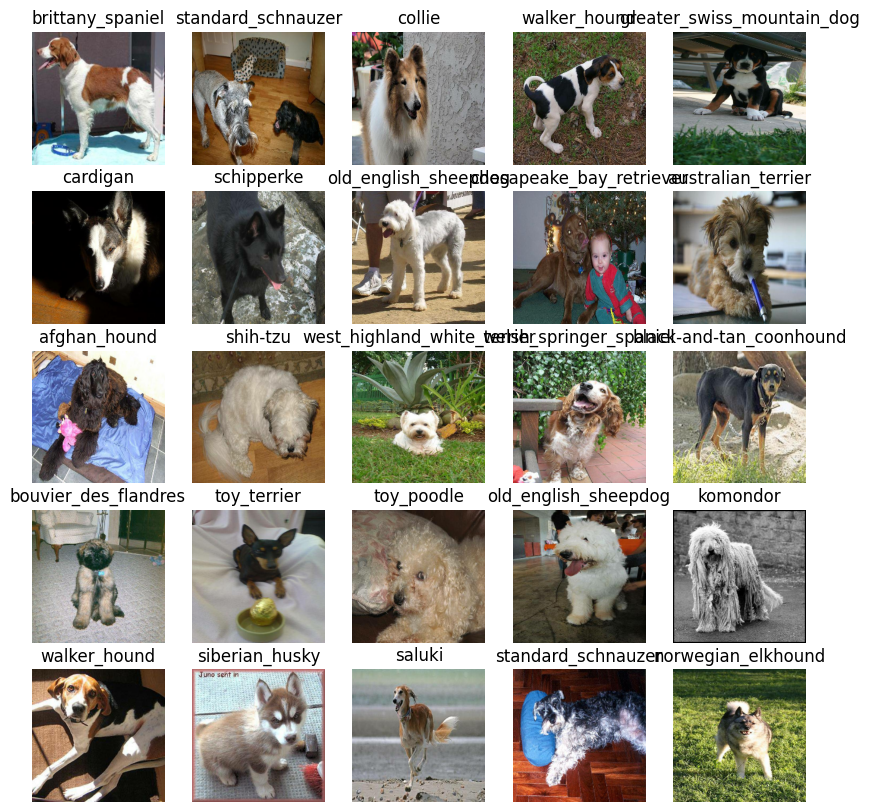

In [ ]:
#Now let's visualise the data in training batch
show_25_images(train_images, train_valid)

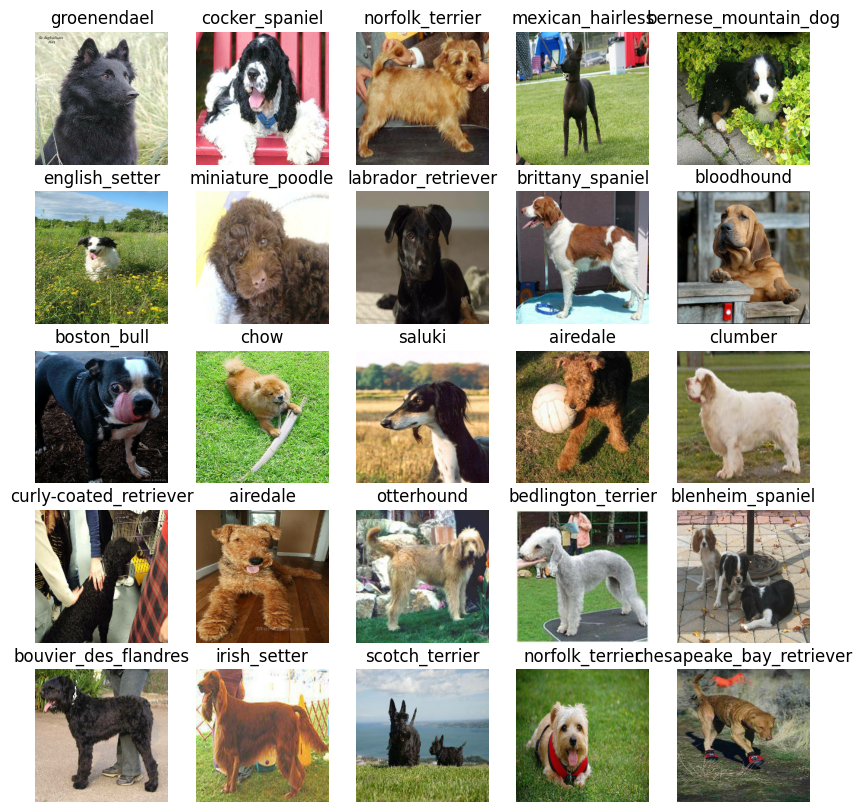

In [ ]:
#Now let's visualise our validation set
val_images, val_labels = next(train_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few things we need to define:

*The imput shape (our image shape, in the form of tensors) to our model.

*The output shape (number of classes in our data set).

*The URL of the model we want to use from
kaggle - https://www.kaggle.com/models/google/mobilenet-v3/TensorFlow2/large-075-224-classification/1

In [ ]:
#Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] #batch, height, width, colour channels

#Setup output shape
OUTPUT_SHAPE = len(unique_breeds)

#Setup model URL
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [ ]:
# version_fn = getattr(tf.keras, "version", None)
# if version_fn and version_fn().startswith("3."):
#   import tf_keras as keras
# else:
#   keras = tf.keras

import tf_keras



Now we've got our input and output shape, let's build a model.
Let's put them together into a keras deep learning model.

knowing this, let's create a funcion which:
* Take the input shape, output shape and the model we've chosen as parameter.
* Define the layers in keras model in sequential fashion.
* Compiles the model(says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* returns the model.

In [ ]:
#Create a function which builds a keras model
def create_model(input_shape = INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url = MODEL_URL):
  print("building model with: ",MODEL_URL)

  #Setup model layers
  model = tf_keras.Sequential([
      hub.KerasLayer(model_url, trainable = False), #Layer1 input layer
      tf_keras.layers.Dense(units = output_shape, activation = "softmax") #Layer2 output layer

  ])

  #Compile the model
  model.compile(
      loss = tf_keras.losses.CategoricalCrossentropy(),
      optimizer = tf_keras.optimizers.Adam(),
      metrics = ['accuracy']
  )

  #Build the model
  model.build(input_shape)

  return model

In [ ]:
model = create_model()
model.summary()

building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [ ]:
outputs = np.ones(shape=(1,1,1280))
outputs

array([[[1., 1., 1., ..., 1., 1., 1.]]])

## Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, checks its progress or stop training early if a model stops improving

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from tarining for too long.

### TensorBoard Callback
To setup a tensorboard we need to do 3 things:
1. Load the tensorboard notebook extension.
2. Create a tensorboard callback which able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualise or models training log with the `%tensorboard` magic funcion (we'll do this after model training).

In [ ]:
# Load TensorBoard notebook expansion
%load_ext tensorboard

In [ ]:
import datetime

#Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  #Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/dog-vision/logs",#make it so that logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%d%m%Y-%H%M%S"))
  return tf_keras.callbacks.TensorBoard(logdir)

### Early stoppng callback

Stop training when a monitored quantity has stopped improving.
It prevents overfitting.

In [ ]:
#Create EarlyStopping callback

early_stopping = tf_keras.callbacks.EarlyStopping(monitor = "val_accuracy",
                                                  patience = 3)

## Training a model(on a subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100 #@param {type: "slider", min:10, max:100, step: 10}

In [ ]:
#Check to make sure we're still running on gpu
print("GPU available" if tf.config.list_physical_devices("GPU") else "not available!")

GPU available


from collections import UserString
Let's create a funcion which trains a model.

* Create a model using `create_model()` function.
* Setup a TensorBoard callback using `create_tensorboard_callback()` function.
* Call the `fit()` function on our model, passing it the training and validation data, number of epochs to train for (`NUM_EPOCHs`) and the  callbacks we'd like to use.
* Return the model.

In [ ]:
# Build a function to train and return a trained model.
def train_model():
  """
  Trains a given model and returns the trained version.
  """

  #Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  #Fit the model to the data passing it the callbacks we created
  model.fit(x= train_data,
            epochs = NUM_EPOCHS,
            validation_data = val_data,
            validation_freq = 1,
            callbacks = [tensorboard, early_stopping ])

  return model

In [ ]:
#Fit the model to the data
model= train_model()

building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 317s 12s/step - loss: 4.6403 - accuracy: 0.0875 - val_loss: 3.3242 - val_accuracy: 0.2200
Epoch 2/100
25/25 [==============================] - 5s 201ms/step - loss: 1.6390 - accuracy: 0.6862 - val_loss: 2.0995 - val_accuracy: 0.4800
Epoch 3/100
25/25 [==============================] - 5s 198ms/step - loss: 0.5620 - accuracy: 0.9438 - val_loss: 1.6418 - val_accuracy: 0.5900
Epoch 4/100
25/25 [==============================] - 4s 171ms/step - loss: 0.2504 - accuracy: 0.9900 - val_loss: 1.4324 - val_accuracy: 0.6250
Epoch 5/100
25/25 [==============================] - 5s 181ms/step - loss: 0.1453 - accuracy: 0.9975 - val_loss: 1.3656 - val_accuracy: 0.6200
Epoch 6/100
25/25 [==============================] - 5s 188ms/step - loss: 0.1012 - accuracy: 0.9987 - val_loss: 1.3170 - val_accuracy: 0.6400
Epoch 7/100
25/25 [=============================

### Checking the TensorBoard logs

The TensorBoard magic function(`%tensorboard`) wil access the logs directory we created earlier and visualise them.

In [ ]:
%tensorboard --logdir drive/MyDrive/dog-vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using the trained model.

In [ ]:
#Make prediction on the validation data(not used to train on)

predictions= model.predict(val_data, verbose = 1)
predictions

7/7 [==============================] - 3s 151ms/step


array([[2.6996364e-03, 1.8931949e-04, 3.9284851e-04, ..., 6.8528339e-04,
        9.7043030e-06, 1.0828694e-03],
       [1.1109002e-03, 4.3604974e-04, 1.4312145e-03, ..., 3.4129765e-04,
        8.2500716e-04, 4.9166218e-05],
       [8.1509505e-05, 6.2950283e-05, 6.0987913e-05, ..., 7.6094788e-05,
        3.3098906e-05, 3.4636399e-04],
       ...,
       [2.4693534e-07, 1.4524087e-05, 1.4414537e-05, ..., 1.6044587e-06,
        6.9327434e-05, 3.9235665e-06],
       [9.0844522e-04, 2.8138736e-04, 1.7957666e-04, ..., 1.0935757e-04,
        2.6346703e-05, 4.2926855e-03],
       [2.0167604e-04, 2.4244553e-06, 2.3786916e-04, ..., 7.4653875e-04,
        1.3148778e-03, 3.2823045e-05]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
#First prediction

index = 0

print(predictions[0])
print(f"Max value (probability of prediction): {np.max(predictions[index])} ")
print(f"Sum idex:  {np.sum(predictions[index])}")
print(f"Max index: { np.argmax(predictions[index])}")
print(f"Predicted label: { unique_breeds[np.argmax(predictions[index])]}")

[2.69963639e-03 1.89319486e-04 3.92848509e-04 1.97127520e-04
 5.70200966e-04 3.90493769e-05 6.03896901e-02 3.40255297e-04
 1.69985680e-04 2.99557520e-04 2.16015062e-04 5.88856456e-05
 2.08260273e-04 2.24447758e-05 2.39260975e-04 5.19374444e-04
 1.49080752e-05 1.34782895e-01 3.54659187e-06 2.64138798e-04
 8.69677402e-04 5.82536923e-05 7.15105489e-06 9.31704533e-04
 6.08895380e-06 1.00399498e-04 5.01528382e-01 5.28686869e-05
 1.22293597e-04 1.78819959e-04 3.80507372e-05 1.39102933e-03
 1.64129873e-04 1.44011829e-05 4.81283059e-05 1.50794294e-02
 4.20751676e-05 1.67579798e-04 2.53139424e-05 2.45158408e-05
 8.18369677e-04 5.14382773e-05 3.56105193e-05 1.23871170e-04
 6.33520585e-06 1.58558949e-04 8.24097879e-06 3.23753920e-05
 9.93337671e-05 3.59069149e-04 4.18959462e-05 1.78110568e-05
 1.22623402e-04 6.79968944e-05 1.29385517e-04 3.62394640e-05
 1.26661005e-04 3.96469980e-03 1.09554509e-04 3.89482118e-02
 8.57038613e-05 1.17855789e-05 4.92631551e-03 1.05459272e-04
 2.00881637e-04 4.613833

Having the above funcionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

**Note** Prediction probabilities also known as confidence levels.

In [ ]:
# Turn prediction probablities into their respective labels(easier to understand)

def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities.
pred_label = get_pred_label(predictions[0])
pred_label

'cairn'

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

Now since our validation data is still in batch dataset, we'll have to unbatchify it to make predictions to the validation lavels(truth labels)

In [ ]:
#Create a function to unbatch a dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) pairs and returns separate arrays for images and labels.
  """
  images = []
  labels = []

  #Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images, labels

#unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(val_labels[0])

'affenpinscher'

Now we've got ways to get:
* Prediction label
* Validation labels(truth labels)
* Validation images

Let's make a function to make these all a bit more visualize.

We'll create a function which:
*  Takes an array of prediction probabilities , an array of truth labels and an array of images and an integer.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and teh target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n =1):
  """
  View the prediction , ground truth and images for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot images & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong.
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change the plot title
  plt.title("{} {:2.0f}% {}".format(pred_label, np.max(pred_prob)*100,
            true_label), color = color)


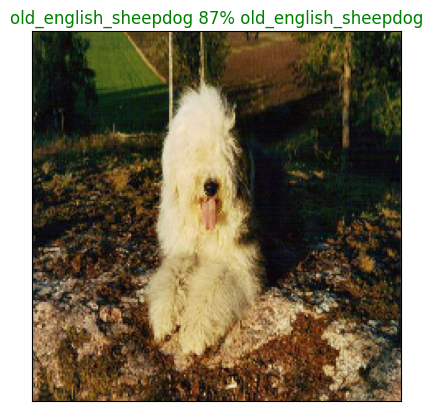

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels = val_labels,
          images = val_images,
          n = 7)

Now we've got a function to visualise our predictions, let's make another function to view or models top 10 predictions.

This function will:
* Take an input of prediction probabilities array and a gound truth array and an integer
* Find the predictions using `get_pred_label()` function.
* Find top 10:
  * Prediction probabilities indexes.
  * Prediction probabilities values.
  * Prediction labels.
* Plot the top 10 prediction probabiilities values and labels, coloring the true labels as green.

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n =1):
  """
  Plus the top 10 highet prediction confidense along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  #Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidense indexes
  top_10_pred_indexes = np.argsort(pred_prob)[-10:][::-1]
  # Find the top 10 prediction confidense values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Plot the top 10 prediction
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color = "grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation = "vertical")

  # Change the color of the true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

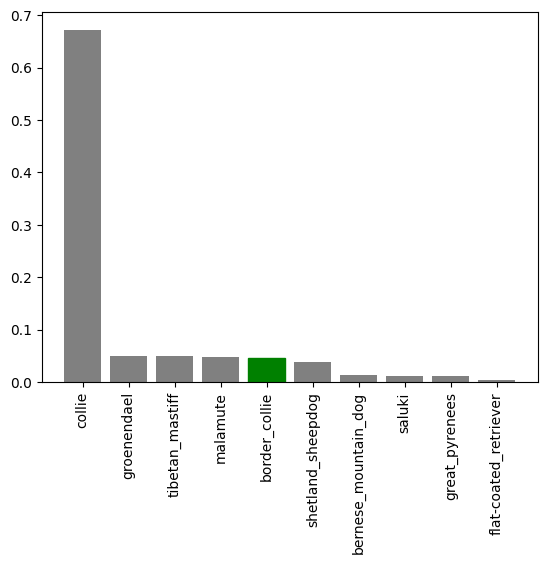

In [ ]:
plot_pred_conf(prediction_probabilities = predictions,
               labels = val_labels,
               n = 9)

 Now we've got some function to visualise our predictoins and evaluate our model, Let's check out a few predictions and thier different values.

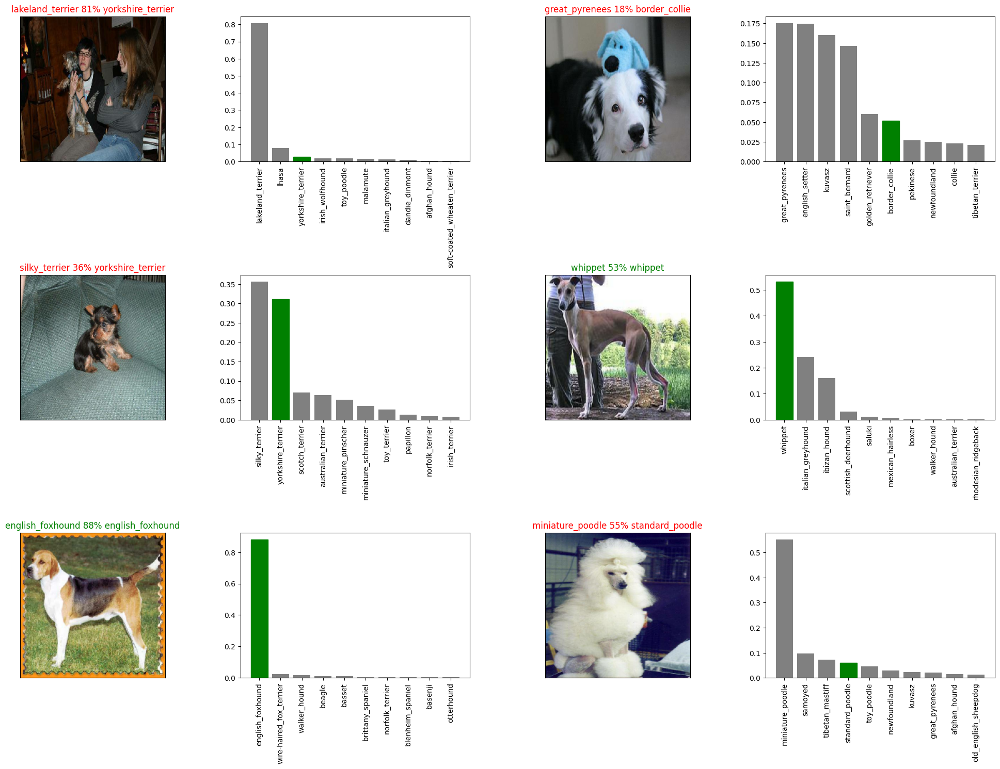

In [ ]:
#Let's check out a few predictions and their different values
i_multiplier = 10
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities = predictions,
            labels = val_labels,
            images = val_images,
            n = i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities = predictions,
                 labels = val_labels,
                 n = i+i_multiplier)
plt.tight_layout(h_pad = 1.0)
plt.show()

### Saving and Reloading a trained model  

In [ ]:
# Create a function to save a model
def save_model(model, suffix = None):
  """
  Saves a given model in a models directory and appends a suffix (str).
  """
  #Create a model directory pathnaem with current time
  modeldir = os.path.join('drive/MyDrive/Dog-vision/models',
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
#Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf_keras.models.load_model(model_path,
                                     custom_objects =  {"KerasLayer": hub.KerasLayer})
  return model

Now we've got the functions to load and save a trained model, let's make sure they work


In [ ]:
#Save our model trained on 1000 images
# save_model(model, suffix = "1000-images-mobilenetv2-Adam")

In [ ]:
# load a trained model
# loaded_1000_image_model = load_model("/content/drive/MyDrive/Dog-vision/models/20240804-081533-1000-images-mobilenetv2-Adam.h5")

In [ ]:
#Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 94ms/step - loss: 1.1764 - accuracy: 0.6700


[1.176386833190918, 0.6700000166893005]

In [ ]:
#Evaluate the laoded model
# loaded_1000_image_model.evaluate(val_data)

In [ ]:
## Training the model on the full data
len(X) , len(Y)

(10222, 10222)

In [ ]:
#Create a data batch with full data set
full_data = create_data_batch(X,Y)

Creating training data batches... 


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
#Create a model for full model
full_model = create_model()

building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
#Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()

#No validation set when training  on all data, so we can't measure validation accuracy
full_model_early_stopping = tf_keras.callbacks.EarlyStopping(monitor = "accuracy",
                                                             patience = 3)

**Note** Running the cell below will take a little while
(maybe 30 minutes for the first epoch) because the gpu we are using in runtime has to load all the images into memory.

In [ ]:
#Fit the full model to fll data
full_model.fit(x=full_data,
               epochs = NUM_EPOCHS,
               callbacks = [full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 48s 136ms/step - loss: 1.3483 - accuracy: 0.6692
Epoch 2/100
320/320 [==============================] - 41s 128ms/step - loss: 0.4076 - accuracy: 0.8765
Epoch 3/100
320/320 [==============================] - 40s 123ms/step - loss: 0.2370 - accuracy: 0.9373
Epoch 4/100
320/320 [==============================] - 46s 144ms/step - loss: 0.1536 - accuracy: 0.9644
Epoch 5/100
320/320 [==============================] - 43s 135ms/step - loss: 0.1079 - accuracy: 0.9790
Epoch 6/100
320/320 [==============================] - 42s 131ms/step - loss: 0.0772 - accuracy: 0.9869
Epoch 7/100
320/320 [==============================] - 42s 132ms/step - loss: 0.0605 - accuracy: 0.9898
Epoch 8/100
320/320 [==============================] - 43s 134ms/step - loss: 0.0464 - accuracy: 0.9944
Epoch 9/100
320/320 [==============================] - 42s 131ms/step - loss: 0.0367 - accuracy: 0.9963
Epoch 10/100
320/320 [==============================] - 40s 125m

In [ ]:
save_model(full_model, suffix = "full-imageset-mobilev2-Adam")

Saving model to: drive/MyDrive/Dog-vision/models/20240807-145102-full-imageset-mobilev2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog-vision/models/20240807-145102-full-imageset-mobilev2-Adam.h5'

In [ ]:
# Load in the full model
loaded_full_model = load_model("drive/MyDrive/Dog-vision/models/20240805-052645-full-imageset-mobilev2-Adam.h5")

Loading saved model from: drive/MyDrive/Dog-vision/models/20240805-052645-full-imageset-mobilev2-Adam.h5


## Making predictions on the test data set
Since our model have been trained on images in the form of Tensor Batches, to make predictions on the test data, we'll have to get it into the same format.


In [ ]:
#Load test image filename
test_path = "drive/MyDrive/dog-vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/dog-vision/test/dccc6c6c2f8cb55631b6ce664bf21fee.jpg',
 'drive/MyDrive/dog-vision/test/e5c9089a34d5352c765e8c453e106122.jpg',
 'drive/MyDrive/dog-vision/test/e57a2bee790b512b2ba824b26f3f93fd.jpg',
 'drive/MyDrive/dog-vision/test/e1adb64372b1784c01401cb73bb20807.jpg',
 'drive/MyDrive/dog-vision/test/dcc047e682db75bbcebdec2288192f1d.jpg',
 'drive/MyDrive/dog-vision/test/e1fa4eb8a57184773ac11efe0de11e92.jpg',
 'drive/MyDrive/dog-vision/test/e21d378710d164f126e7d0b380dc7a1a.jpg',
 'drive/MyDrive/dog-vision/test/de85fdcf74dbe025b9b89819735cb9bc.jpg',
 'drive/MyDrive/dog-vision/test/e6b1859592468c8ffc1a73f87b201ba7.jpg',
 'drive/MyDrive/dog-vision/test/de2c6675c001726a96ad9d72ab229f3a.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
test_data = create_data_batch(test_filenames, test_data = True)

Creating test data batches... 


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
#Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose =1)

In [ ]:
#Save the predictions in csv file
np.savetxt("drive/MyDrive/dog-vision/preds_array.csv", test_predictions, delimiter = ",")

In [ ]:
test_predictions[:10]

In [ ]:
test_predictions.shape

##Preparing test data set predictions for kaggle


In [ ]:
#Create a pandas Datafrome with empty columns
preds_df = pd.DataFrame(columns = ["id"] + list(unique_breeds))
preds_df.head()

In [ ]:
#Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
test_ids

In [ ]:
preds_df["id"] = test_ids

In [ ]:
preds_df.head()

In [ ]:
# Add the predictions probabilities to each dog column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

In [ ]:
#Save our predictions dataframe to csv for submission  to kaggle
preds_df.to_csv("drive/MyDrive/dog-vision/full_model_predictions_submission_1_mobilenetV2.csv",
                index = False)